In [1]:
import numpy as np
import matplotlib.pylab as plt
import cv2
from matplotlib import image
import os
import numpy as np
from scipy import ndimage
from scipy.ndimage import morphology
import mach_functions


pygame 1.9.6
Hello from the pygame community. https://www.pygame.org/contribute.html


In [2]:
filter_dir = "./filter_images/"
def readInfilters(filter_dir,filter_names = ['ram','rod','amoe','dys','hyp']):
    """
    Read in previously generated MACH filters AS Well as generate a penalty 
    filter for the rod filter

    The output is a dict
    """
    filters = dict()
    
    for i in filter_names:
        filters[i] = np.loadtxt(filter_dir+"/"+i+'_filter') # read in ndarray

    #generate a penalty filter for the rod MACH filter
    norm_rod = filters['rod']/np.max(filters['rod'])
    mask = np.greater(norm_rod,0.4).astype(np.float)
    mask = morphology.binary_dilation(mask,iterations=2)
    filters['rodp'] = filters['ram'].copy()
    filters['rodp'][mask == 1.0] = 0.0

    np.savetxt(filter_dir+'rodp_filter',filters['rodp'])

    return filters






In [3]:
filters = readInfilters(filter_dir)

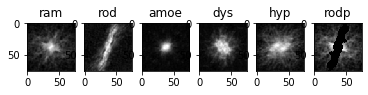

In [4]:
n = 0 
for i in filters.keys():
    n += 1
    plt.subplot(1,6,n)
    plt.imshow(filters[i],cmap='gray')
    plt.title(i)

In [5]:
truthImage = cv2.imread("/home/binsun/microglia_MACH/tutorial/TestImages/Sample_annotate.png")
truthImage = cv2.cvtColor(truthImage,cv2.COLOR_BGR2RGB)

In [6]:
maskes = mach_functions.extractTruthMaske(truthImage)

amoe 1 2
dys 0 1


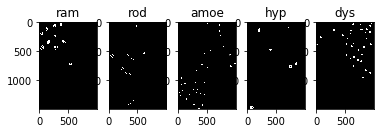

In [7]:
n=0
for i in maskes.keys():
    n += 1
    plt.subplot(1,5,n)
    plt.imshow(maskes[i],cmap='gray')
    plt.title(i)

In [8]:
import mach_util as mu

In [9]:
testImage = cv2.imread("/home/binsun/microglia_MACH/tutorial/TestImages/newSample.png")
testImage = cv2.cvtColor(testImage,cv2.COLOR_BGR2RGB)
testImage = mach_functions.PreProcessCroppedCells(testImage)


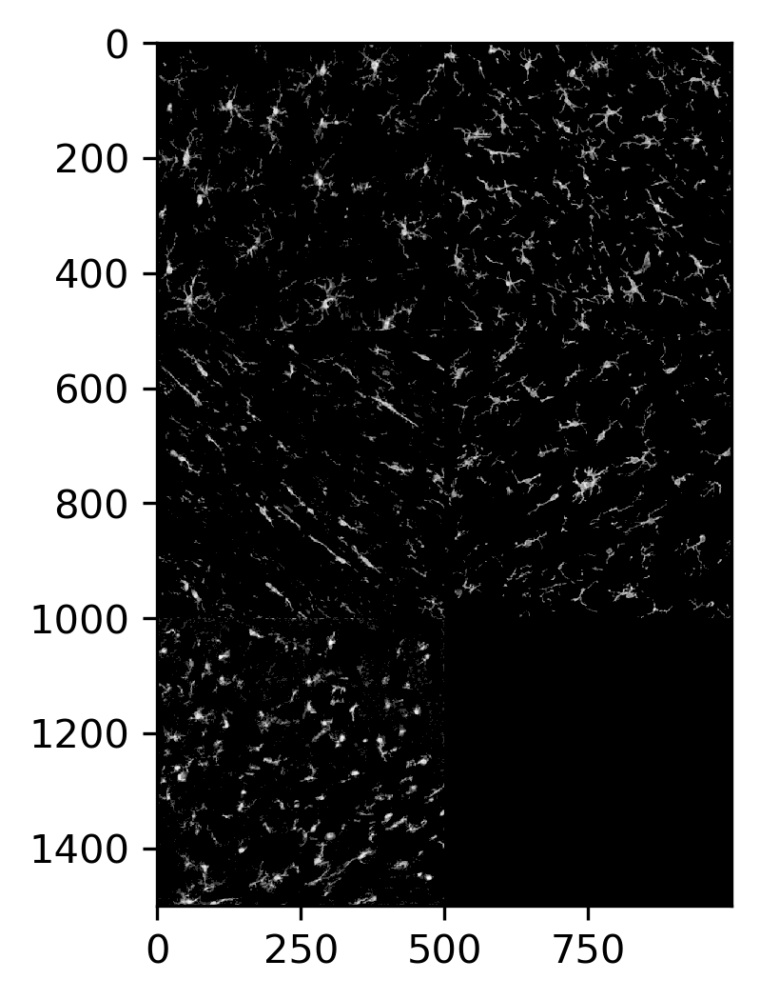

In [10]:
plt.figure(dpi=300)
plt.imshow(testImage,cmap='gray')

In [11]:
results = mach_functions.Rodrotate(testImage,filters['rod'],filters['rodp'],rod_thres=0.295,rodp_thres=0.185)

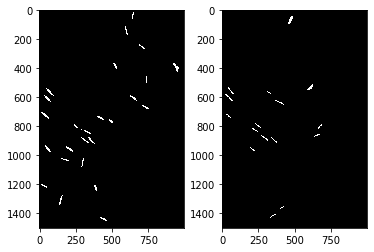

In [13]:
plt.subplot(1,2,1)
plt.imshow(results,cmap='gray')
plt.subplot(1,2,2)
plt.imshow(maskes['rod'],cmap='gray')

In [14]:
Detected_cells, TP = mach_functions.calculate_TP(results,maskes['rod'],returnOverlap=True)

Found 16 cells in the annoated image
Successfully detected 7 cells
The True Positive (TP) score is  0.44


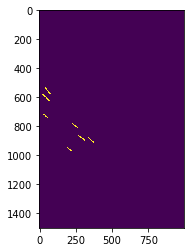

In [15]:
plt.imshow(Detected_cells)

In [16]:
def removeDetectedCells(TestImage,detected_cells,bgmthres=0.4):
    """
    Remove the detected cells of one filter from the test image so that we can 
    apply the next filter

    TestImage: gray-scale image
    detected_cells: binary image of detected cells using one filter
    bgmthres: thresholding value for cells/background 

    output: new TestImage
    """
    
    # generate a binary image of the test image
    bimage = np.greater(TestImage,bgmthres).astype(np.float)

    #background gray-scale value
    bgmValue = np.average(testImage[bimage==0])

    labels, numofgroups = measurements.label(bimage)

    overlap = detected_cells*bimage

    results = np.ones(bimage.shape)
    for i in np.arange(1,numofgroups+1):
        if np.sum(overlap[labels == i]) != 0:
            results[labels==i] = 0.0

    newtestImage = testImage.copy()
    newtestImage[results==0] = bgmValue
    
    return newtestImage



In [17]:
from scipy.ndimage import measurements

In [18]:
newtestImage = removeDetectedCells(testImage,results,bgmthres=0.4)

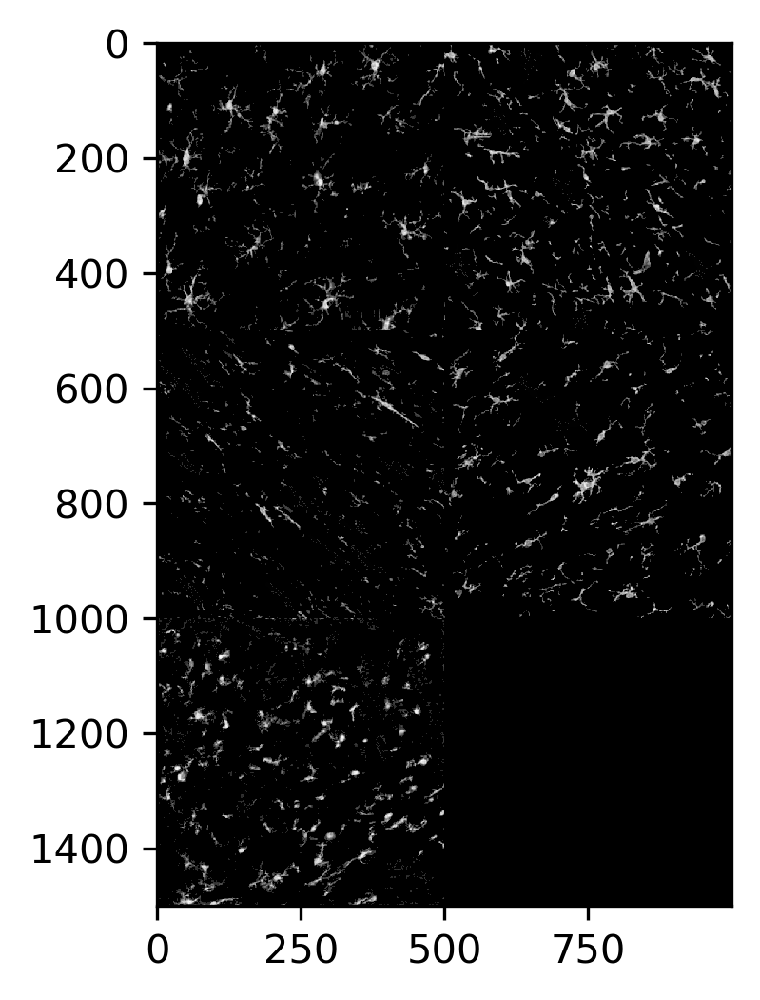

In [19]:
plt.figure(dpi=300)
plt.imshow(newtestImage,cmap='gray')

In [20]:
#generate a filter for the process of hyper and ramified, respectively
norm_rod = filters['ram']/np.max(filters['ram'])
mask = np.greater(norm_rod,0.4).astype(np.float)
mask = morphology.binary_dilation(mask,iterations=1)
filters['ramp'] = filters['ram'].copy()
filters['ramp'][mask == 1.0] = 0.0




In [21]:
norm_rod = filters['hyp']/np.max(filters['hyp'])
mask = np.greater(norm_rod,0.4).astype(np.float)
mask = morphology.binary_dilation(mask,iterations=1)
filters['hypp'] = filters['hyp'].copy()
filters['hypp'][mask == 1.0] = 0.0

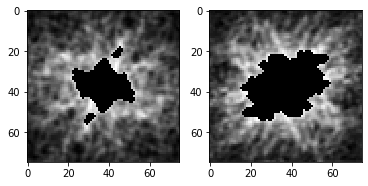

In [22]:
plt.subplot(1,2,1)
plt.imshow(filters['ramp'],cmap='gray')
plt.subplot(1,2,2)
plt.imshow(filters['hypp'],cmap='gray')

In [23]:
np.savetxt(filter_dir+'ramp_filter',filters['ramp'])

In [24]:
np.savetxt(filter_dir+'hypp_filter',filters['hypp'])

In [25]:
ramp_hits = ndimage.convolve(newtestImage,filters['ramp'])
hypp_hits = ndimage.convolve(newtestImage,filters['hypp'])
ram_hits = ndimage.convolve(newtestImage,filters['ram'])
hyp_hits = ndimage.convolve(newtestImage,filters['hyp'])

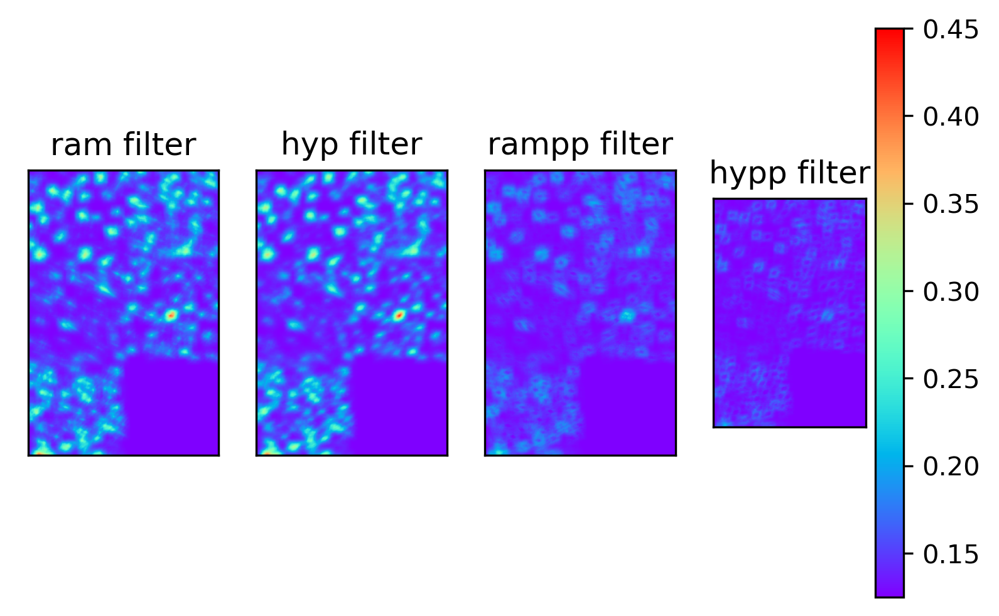

In [26]:
plt.figure(dpi=300)
plt.subplot(1,4,1)
plt.imshow(ram_hits,cmap='rainbow',vmax=0.45)
plt.title('ram filter')
plt.xticks([])
plt.yticks([])
#plt.colorbar()
plt.subplot(1,4,2)
plt.imshow(hyp_hits,cmap='rainbow',vmax=0.45)
plt.title('hyp filter')
plt.xticks([])
plt.yticks([])
#plt.colorbar()

plt.subplot(1,4,3)
plt.imshow(ramp_hits,cmap='rainbow',vmax=0.45)
plt.title('rampp filter')
plt.xticks([])
plt.yticks([])
#plt.colorbar()
plt.subplot(1,4,4)
plt.imshow(hypp_hits,cmap='rainbow',vmax=0.45)
plt.title('hypp filter')
plt.xticks([])
plt.yticks([])
plt.colorbar()



In [101]:
ramp_dectected = np.greater(ramp_hits,0.22).astype(np.float)
hypp_dectected = np.greater(hypp_hits,0.18).astype(np.float)

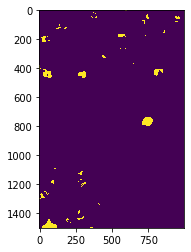

In [102]:
plt.imshow(ramp_dectected)

In [27]:
def giveRamHyp(ramp_hits,hypp_hits,rampthres=0.22,hyppthres=0.18):
    """
    give the detected ramified cells and hypertrophic cells 
    based on the hits of ramifiled process filter (ramp) and
    hyertrophic process filter (hypp)
    """
    ramp_detected = np.greater(ramp_hits,rampthres).astype(np.float)
    hypp_detected = np.greater(hypp_hits,hyppthres).astype(np.float)

    # the overlapped area between ramp_detected and hypp_detected are assigned as hyptrophic cells
    # the remaining part in the ramp_detected are ramified cells


    labels, numofgroups = measurements.label(ramp_detected)

    overlap = ramp_detected*hypp_detected

    results = np.ones(ramp_detected.shape)
    for i in np.arange(1,numofgroups+1):
        if np.sum(overlap[labels == i]) != 0:
            results[labels==i] = 0.0

    ram_cells = ramp_detected.copy()
    hyp_cells = np.zeros(ramp_detected.shape)

    ram_cells[results==0] = 0

    hyp_cells[results == 0] = 1
    
    
    return ram_cells, hyp_cells


In [37]:
ram_cells, hyp_cells = giveRamHyp(ramp_hits,hypp_hits)

In [41]:
tp1 = mach_functions.calculate_TP(ram_cells,maskes['ram'])
tp2 = mach_functions.calculate_TP(ram_cells,maskes['hyp'])

Found 10 cells in the annoated image
Successfully detected 6 cells
The True Positive (TP) score is  0.60
Found 6 cells in the annoated image
Successfully detected 2 cells
The True Positive (TP) score is  0.33


In [42]:
newtestImage = removeDetectedCells(newtestImage,ram_cells)

In [43]:
newtestImage = removeDetectedCells(newtestImage,hyp_cells)

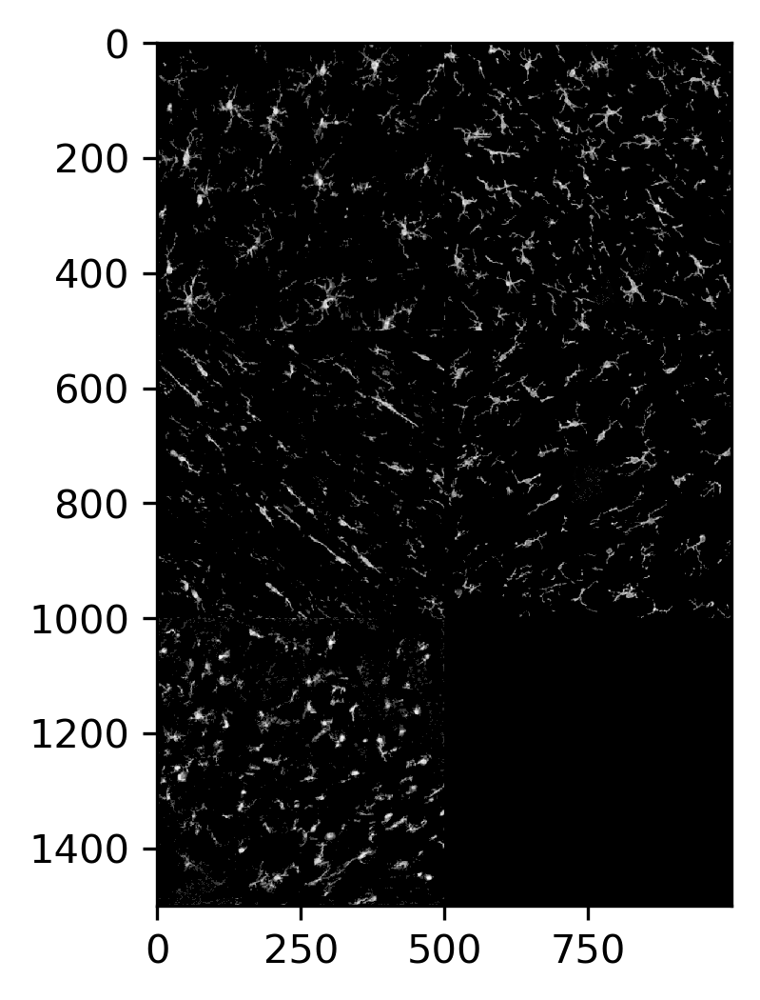

In [44]:
plt.figure(dpi=300)
plt.imshow(newtestImage,cmap='gray')

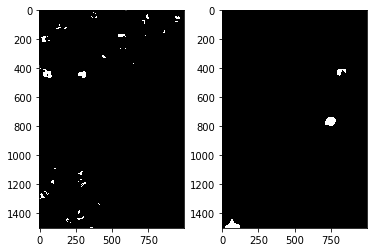

In [38]:
plt.subplot(1,2,1)
plt.imshow(ram_cells,cmap='gray')
plt.subplot(1,2,2)
plt.imshow(hyp_cells,cmap='gray')

In [39]:
tempImage = cv2.imread("/home/binsun/microglia_MACH/tutorial/TestImages/newSample.png")
tempImage = cv2.cvtColor(tempImage,cv2.COLOR_BGR2RGB)

In [40]:
ramImage = mach_functions.pasteImage(tempImage,ram_cells,'green')
hypImage = mach_functions.pasteImage(tempImage,hyp_cells,'blue')

In [30]:
ram_TP = []
hyp_TP = []
for i in [0.18,0.19,0.20,0.21,0.22,0.23,0.24,0.25]: # rampthres
    for j in [0.14,0.15,0.16,0.17,0.18,0.19,0.20,0.21]: #hyppthres
        ram_cells, hyp_cells = giveRamHyp(ramp_hits,hypp_hits,rampthres=i,hyppthres=j)
        ramtp = mach_functions.calculate_TP(ram_cells,maskes['ram'])
        hyptp = mach_functions.calculate_TP(hyp_cells,maskes['hyp'])
        ram_TP.append(ramtp)
        hyp_TP.append(hyptp)



Found 10 cells in the annoated image
Successfully detected 0 cells
The True Positive (TP) score is  0.00
Found 6 cells in the annoated image
Successfully detected 6 cells
The True Positive (TP) score is  1.00
Found 10 cells in the annoated image
Successfully detected 0 cells
The True Positive (TP) score is  0.00
Found 6 cells in the annoated image
Successfully detected 6 cells
The True Positive (TP) score is  1.00
Found 10 cells in the annoated image
Successfully detected 1 cells
The True Positive (TP) score is  0.10
Found 6 cells in the annoated image
Successfully detected 6 cells
The True Positive (TP) score is  1.00
Found 10 cells in the annoated image
Successfully detected 2 cells
The True Positive (TP) score is  0.20
Found 6 cells in the annoated image
Successfully detected 6 cells
The True Positive (TP) score is  1.00
Found 10 cells in the annoated image
Successfully detected 2 cells
The True Positive (TP) score is  0.20
Found 6 cells in the annoated image
Successfully detected 6

In [31]:
ramTP = np.asarray(ram_TP)
hypTP = np.asarray(hyp_TP)

In [32]:
ramTP = ramTP.reshape((8,8))
hypTP = hypTP.reshape((8,8))

Text(0.5, 0, 'Thres. of hypp filter')

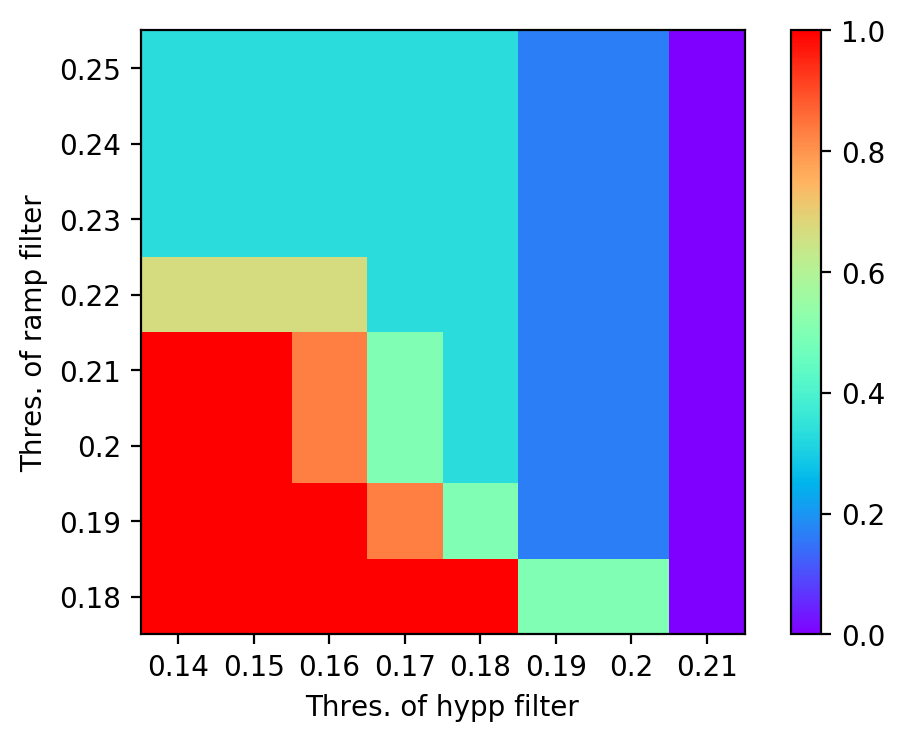

In [36]:
plt.figure(dpi=200)
plt.imshow(hypTP,origin='lower',cmap="rainbow")
plt.colorbar()
plt.yticks(np.arange(8),[0.18,0.19,0.20,0.21,0.22,0.23,0.24,0.25])
plt.ylabel("Thres. of ramp filter")
plt.xticks(np.arange(8),[0.14,0.15,0.16,0.17,0.18,0.19,0.20,0.21])
plt.xlabel("Thres. of hypp filter")

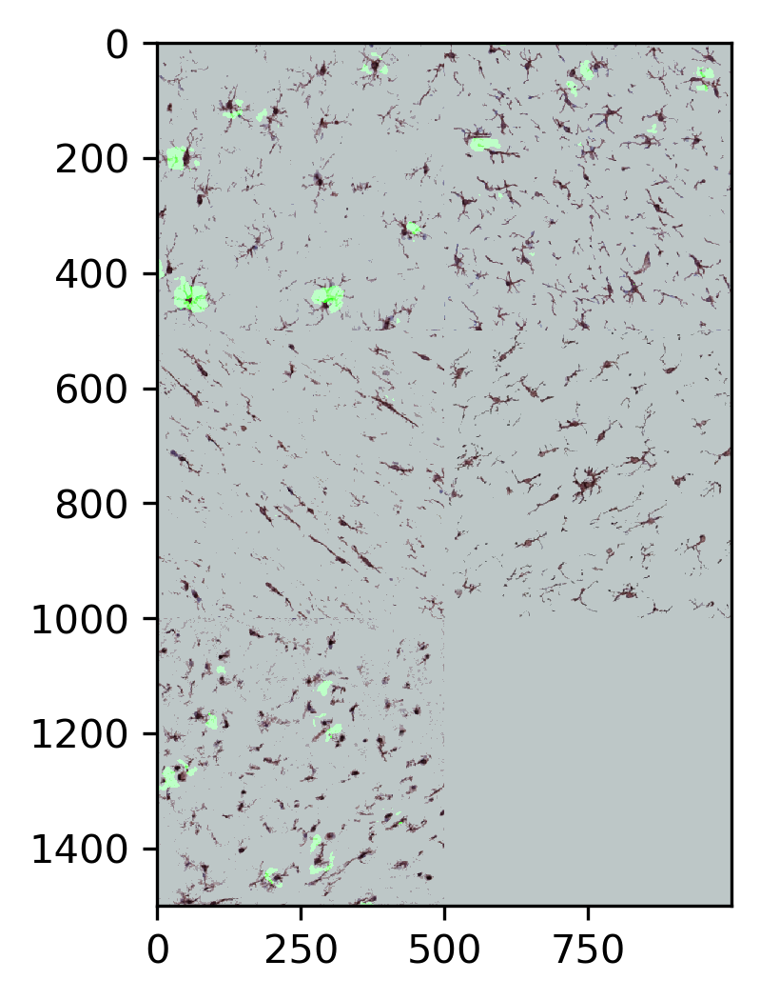

In [107]:
plt.figure(dpi=300)
plt.imshow(ramImage)

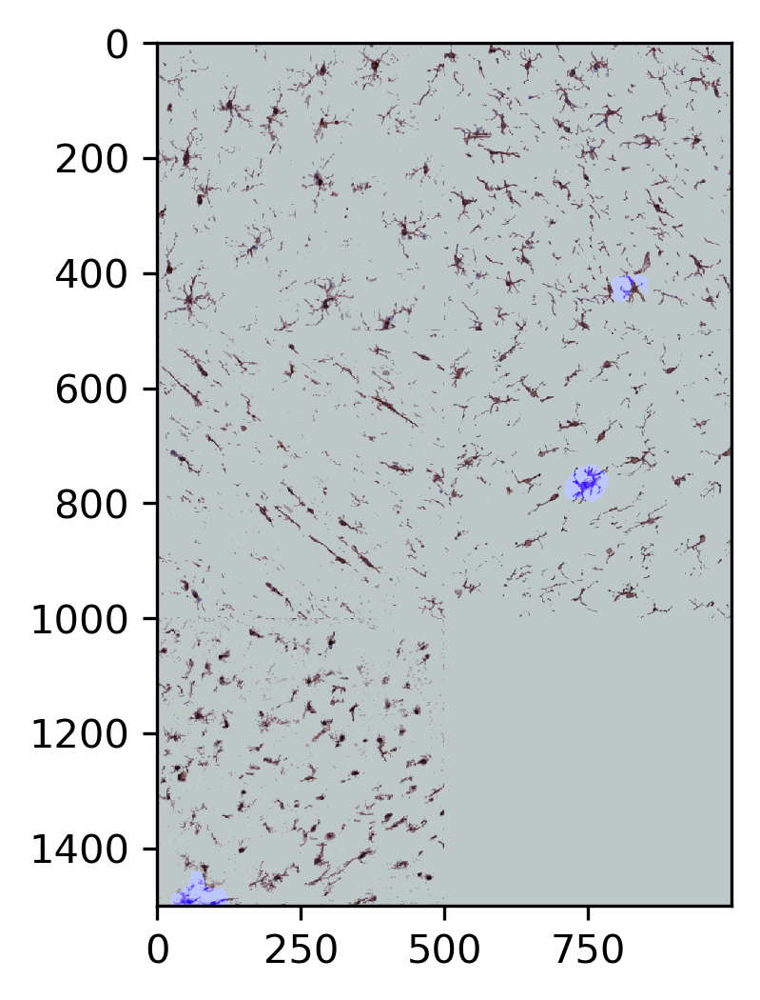

In [108]:
plt.figure(dpi=300)
plt.imshow(hypImage)

In [12]:
import pickle

with open('rod_thres_TP','wb') as f:
    pickle.dump(all_TP,f)
    
with open('rod_thres_detected_cells','wb') as f:
    pickle.dump(all_detected_cells,f)

In [13]:
tp = np.asarray(all_TP)

In [15]:
tp = tp.reshape((9,9))

Text(0.5, 0, 'Thres. of RodP filter')

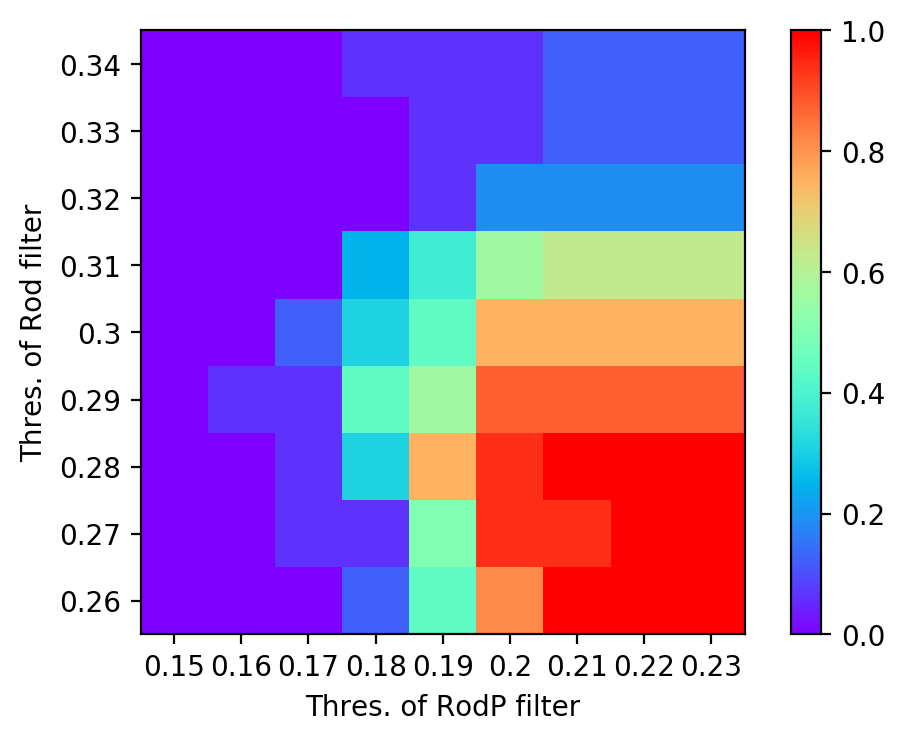

In [25]:
plt.figure(dpi=200)
plt.imshow(tp,origin='lower',cmap="rainbow")
plt.colorbar()
plt.yticks(np.arange(9),rod_thres)
plt.ylabel("Thres. of Rod filter")
plt.xticks(np.arange(9),rodp_thres)
plt.xlabel("Thres. of RodP filter")

In [33]:
TP = mach_functions.calculate_TP(results,maskes['rod'])

Found 16 cells in the annoated image
Successfully detected 6 cells
The True Positive (TP) score is  0.38


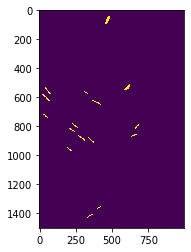

In [36]:
plt.imshow(maskes['rod'])

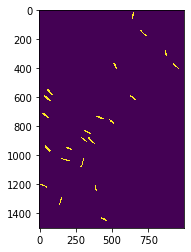

In [29]:
plt.imshow(results)

In [27]:
tempImage = cv2.imread("/home/binsun/microglia_MACH/tutorial/TestImages/newSample.png")
tempImage = cv2.cvtColor(tempImage,cv2.COLOR_BGR2RGB)

In [40]:
pImage = mach_functions.pasteImage(tempImage,results,'red')

([], <a list of 0 Text yticklabel objects>)

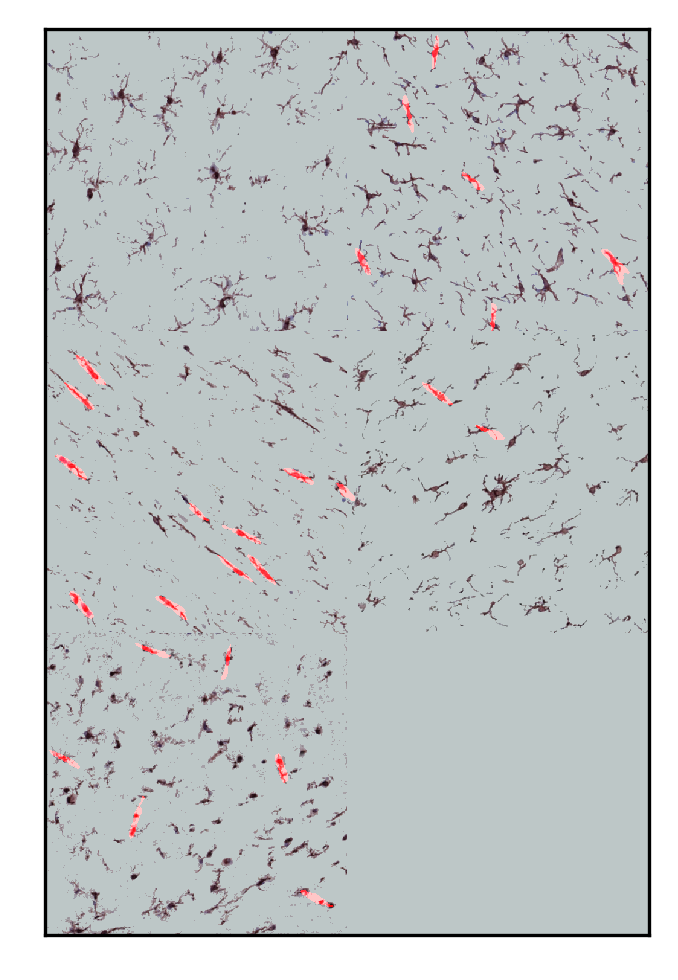

In [41]:
plt.figure(dpi=300)
plt.imshow(pImage)
plt.xticks([])
plt.yticks([])

In [ ]:
mach_functions.pasteImage()

In [23]:
ROD_FILTER_SNR_THRES = 1.04

INNER_RADIUS = 20
OUTER_RADIUS = 25

In [24]:
all_SNR = dict()
all_detected_cells = dict()
all_TP = dict()
all_hits = dict()
for i in filters.keys():
    hits = ndimage.convolve(testImage,filters[i])
    all_hits[i] = hits
    #hits = ndimage.convolve(testImage,rotated_rod)
    SNR = mu.giveAnnulusSNR(hits,INNER_RADIUS,OUTER_RADIUS,thresh=ROD_FILTER_SNR_THRES,verbose=False)
    all_SNR[i] = SNR
    detected_cells, TP = mach_functions.calculate_TP(SNR[1],maskes[i],returnOverlap=True)
    all_detected_cells[i] = detected_cells
    all_TP[i] = TP


Found 10 cells in the annoated image
Successfully detected 10 cells
The True Positive (TP) score is  1.00
Found 16 cells in the annoated image
Successfully detected 4 cells
The True Positive (TP) score is  0.25
Found 51 cells in the annoated image
Successfully detected 51 cells
The True Positive (TP) score is  1.00
Found 33 cells in the annoated image
Successfully detected 33 cells
The True Positive (TP) score is  1.00
Found 6 cells in the annoated image
Successfully detected 6 cells
The True Positive (TP) score is  1.00


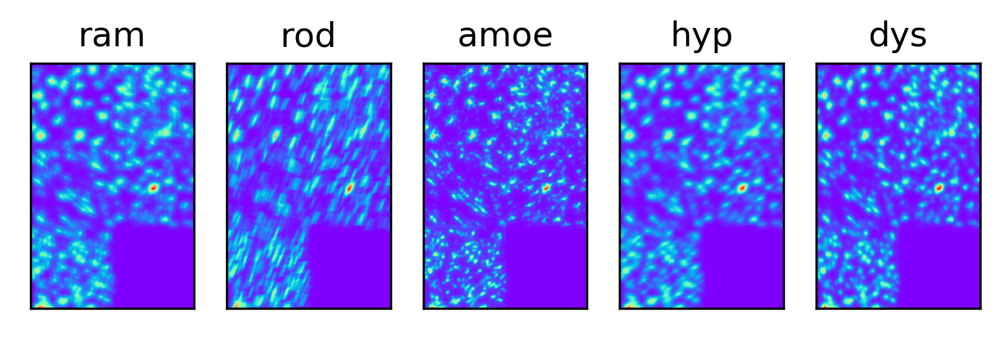

In [25]:
n=0
plt.figure(dpi=300)
#plt.figure(figsize=(5,1))
for i in maskes.keys():
    n += 1
    plt.subplot(1,5,n)
    plt.imshow(all_hits[i],cmap='rainbow')
    plt.xticks([])
    plt.yticks([])
    plt.title(i)

In [27]:
import imutils

In [ ]:
#TODO for rod filter, we should have a penatly filter (process only)

In [28]:
#we need to rotate the rod filter 
angles = [-90,-70,-50,-30,-10, 0, 10,30,50,70,90] # angles for rotated rod filters


all_hits = []
all_TP = [] # all true positive score
for i in angles:
    rotated_rod = imutils.rotate(filters['rod'],i)
    hits = ndimage.convolve(testImage,rotated_rod)
    SNR = mu.giveAnnulusSNR(hits,INNER_RADIUS,OUTER_RADIUS,thresh=ROD_FILTER_SNR_THRES,verbose=False)
    all_hits.append(hits)
   

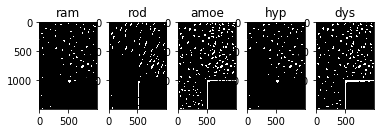

In [79]:
n=0
for i in maskes.keys():
    n += 1
    plt.subplot(1,5,n)
    plt.imshow(all_SNR[i][1],cmap='gray')
    plt.title(i)

In [6]:
# construct a image using these filters with gaussian noise
def add_gaussian_noise(image,var=0.1):
    
    dimes = image.shape
    mean = 0.0
    sigma = var**0.5
    gauss = np.random.normal(mean,sigma,dimes)
    #gauss = gauss.reshape(dimes)
    noisy = image + gauss
    return noisy
    
    

In [7]:
print (np.min(filters['ram_filter']),np.max(filters['ram_filter']))

0.0 1.0


In [8]:
nram_filter = add_gaussian_noise(filters['ram_filter'],var=0.003)

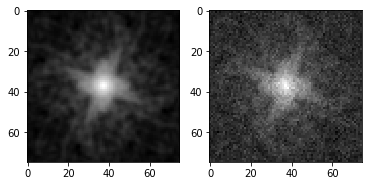

In [9]:
plt.subplot(1,2,1)
plt.imshow(filters['ram_filter'],cmap='gray')
plt.subplot(1,2,2)
plt.imshow(nram_filter,cmap='gray')

In [10]:
# get the PSD of each filter
aa = np.fft.fft2(filters['ram_filter'])


In [11]:
from scipy import ndimage

In [12]:
def azimuthally_psd(image,bins=30):
    '''
    generate the PSD along radial direction
    '''
    fftimage = np.fft.fft2(image)
    
    dimes = fftimage.shape
    centerX = int(dimes[0]/2)
    centerY = int(dimes[1]/2)
    maskimage = np.ones(dimes)
    maskimage[centerX,centerY] = 0
    
    edt_mask = ndimage.distance_transform_edt(maskimage)
    
    ori_psd = np.log(np.abs(np.fft.fftshift(fftimage))**2)
    # max radial length
    mlen = np.sqrt(centerX**2+centerY**2)
    spacing = mlen/bins
    
    
    psd = []
    dist = []
    for i in np.arange(bins):
        low_limit = i*spacing
        high_limit = (i+1)*spacing
        dist_i = 0.5*(low_limit + high_limit)
        
        indx = np.logical_and(np.greater_equal(edt_mask,low_limit),np.less(edt_mask,high_limit))
        psd_i = np.sum(ori_psd[indx])/np.sum(maskimage[indx])
        psd.append(psd_i)
        dist.append(dist_i)
        
    return dist,psd

In [13]:
psd = dict()

for i in filters.keys():
    psd[i] = azimuthally_psd(filters[i])
    

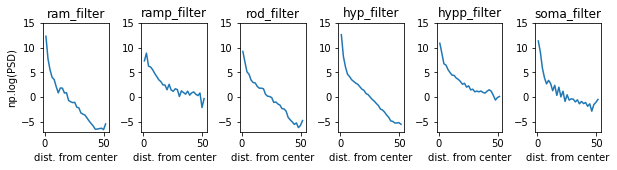

In [14]:

n=0
plt.figure(figsize=(10,2))
for i in filters.keys():
    n += 1
    plt.subplot(1,6,n)
    plt.plot(psd[i][0],psd[i][1])
    plt.subplots_adjust(wspace=0.5)
    plt.ylim([-7,15])
    plt.title(i)
    if n == 1:
        plt.ylabel('np.log(PSD)')
    plt.xlabel('dist. from center')

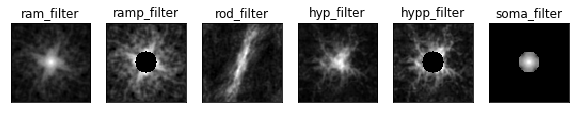

In [15]:
n=0
plt.figure(figsize=(10,10))
for i in filters.keys():
    n += 1
    plt.subplot(1,6,n)
    plt.imshow(filters[i],cmap='gray')
    plt.xticks([])
    plt.yticks([])
    plt.title(i)

In [16]:
# now construct a large image using the ram_filter, rod_filter and hyp_filter

perct = {
    'ram_filter': 0.2,
    'rod_filter': 0.3,
    'hyp_filter': 0.5
}

In [17]:
def construct_test_image(filternames,perct=None, nRows=50,nCols=50):
    '''
    construct a test image (size = nRows x nCols filters) using filternames (a list containts the name)
    and the percentage of each filter
    '''
    filter_dimes = np.shape(filters[filternames[0]])
    image_size_x = filter_dimes[0]*nRows
    image_size_y = filter_dimes[1]*nCols
    
    test_image = np.ones((image_size_x,image_size_y))
    
    
    numFilters = len(filternames) # the number of filters
    
    for m in np.arange(nRows):
        for n in np.arange(nCols):
            prob = np.random.rand()
            for j in np.arange(numFilters):
                    if j == 0:
                        left = 0
                    else: 
                        left = np.sum(perct[0:j])
                    right = left + perct[j]
                    if prob >= left and prob <= right:
                        indx = j

            test_image[m*filter_dimes[0]:(m+1)*filter_dimes[0],\
                        n*filter_dimes[1]:(n+1)*filter_dimes[1]] = filters[filternames[indx]]
            
    # now add some gaussian noise
    test_image = add_gaussian_noise(test_image,var=0.003)
       
    return test_image

In [36]:
perct = [0.6,0.2,0.2]
test_image = construct_test_image(['ram_filter','rod_filter','hyp_filter'],perct=perct\
                                 ,nRows=10,nCols=30)

([], <a list of 0 Text yticklabel objects>)

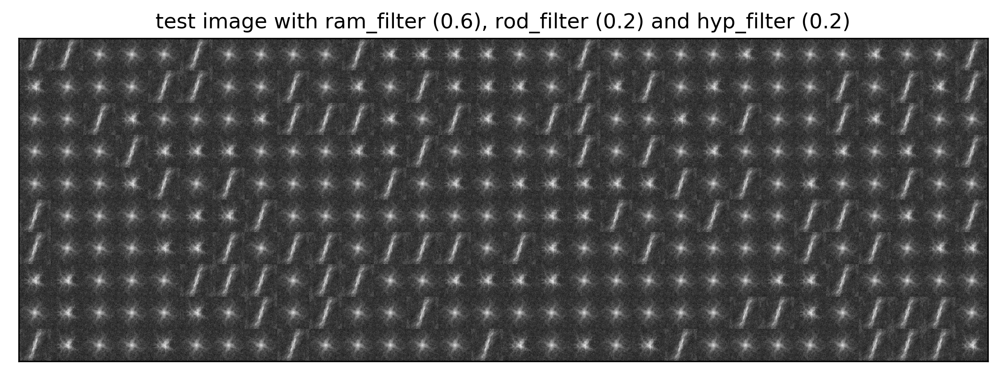

In [37]:
plt.figure(figsize=(10,10),dpi=300)
plt.imshow(test_image,cmap='gray')
plt.title('test image with ram_filter (%s), rod_filter (%s) \
and hyp_filter (%s)' %  (str(perct[0]),str(perct[1]),str(perct[2])))
plt.xticks([])
plt.yticks([])

In [22]:
# manually construct a ram_filter that has 1/2 of its original intensity
filters['dimmer_ram_filter'] = filters['ram_filter'].copy()
filters['dimmer_ram_filter'] = 0.5*filters['dimmer_ram_filter']

Text(0.5, 1.0, 'dimmer_ram_filter')

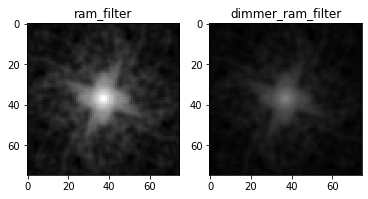

In [28]:
plt.subplot(1,2,1)
plt.imshow(filters['ram_filter'],cmap='gray',vmax=1)
plt.title('ram_filter')
plt.subplot(1,2,2)
plt.imshow(filters['dimmer_ram_filter'],cmap='gray',vmax=1)
plt.title('dimmer_ram_filter')

In [42]:
perct = [0.6,0.2,0.2]
test_image = construct_test_image(['dimmer_ram_filter','rod_filter','hyp_filter'],perct=perct\
                                 ,nRows=10,nCols=30)

([], <a list of 0 Text yticklabel objects>)

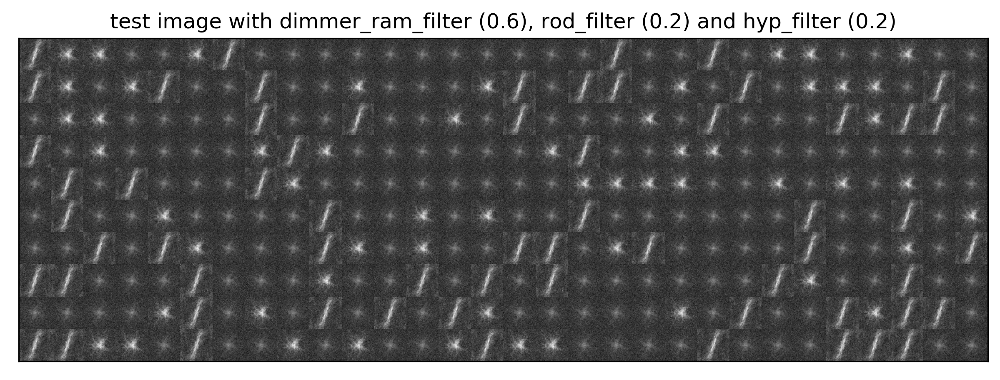

In [43]:
plt.figure(figsize=(10,10),dpi=300)
plt.imshow(test_image,cmap='gray')
plt.title('test image with dimmer_ram_filter (%s), rod_filter (%s) \
and hyp_filter (%s)' %  (str(perct[0]),str(perct[1]),str(perct[2])))
plt.xticks([])
plt.yticks([])

In [44]:
ram_resp = ndimage.convolve(test_image,filters['ram_filter'])
rod_resp = ndimage.convolve(test_image,filters['rod_filter'])
hyp_resp = ndimage.convolve(test_image,filters['hyp_filter'])

In [53]:
vmax = np.amax([np.max(ram_resp),np.max(rod_resp),np.max(hyp_resp)])

([], <a list of 0 Text yticklabel objects>)

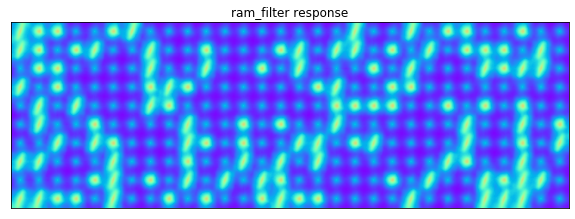

In [60]:
plt.figure(figsize=(10,10))
plt.imshow(ram_resp,cmap='rainbow',vmax=vmax)
plt.title('ram_filter response')
plt.xticks([])
plt.yticks([])
#plt.colorbar()

([], <a list of 0 Text yticklabel objects>)

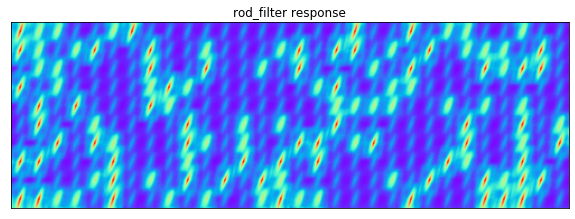

In [61]:
plt.figure(figsize=(10,10))
plt.imshow(rod_resp,cmap='rainbow',vmax=vmax)
plt.title('rod_filter response')
plt.xticks([])
plt.yticks([])
#plt.colorbar()

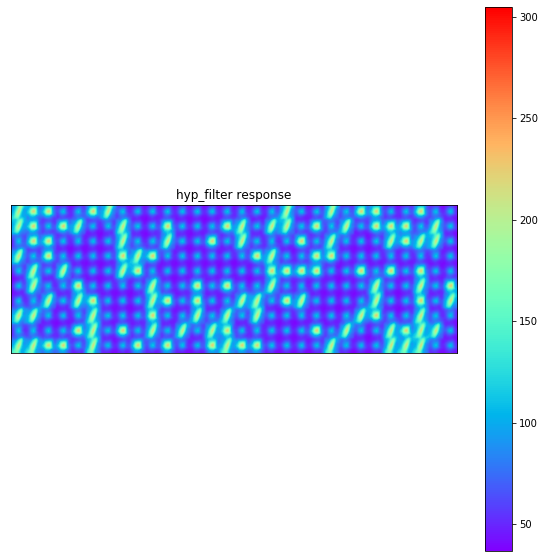

In [63]:
plt.figure(figsize=(10,10))
plt.imshow(hyp_resp,cmap='rainbow',vmax=vmax)
plt.title('hyp_filter response')
plt.xticks([])
plt.yticks([])
plt.colorbar()

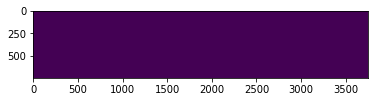

In [23]:
plt.imshow(tt)

In [16]:
idx = np.greater_equal(edt,10)
cc = edt.copy()
cc[idx] = 0

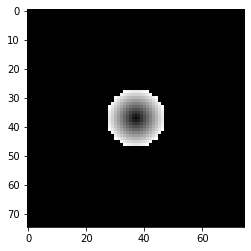

In [17]:
plt.imshow(cc,cmap='gray')

In [ ]:
plt.plot(psd)

In [31]:
aa = cv2.imread(filter_directory+'ramp_filter.png',0) # read in gray_scale_mode

In [37]:
print (np.min(aa),np.max(aa))

30 215


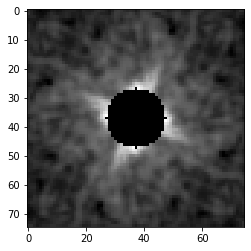

In [33]:
plt.imshow(aa,cmap='gray')